In [1]:
import folium
import pandas as pd
import os 

# Je crée une liste de couleurs pour l'affichage
colors = ["blue","orange","green","yellow","red","black"]
index_color=0
# Je crée une carte centrée autour du lieu voulu
m = folium.Map(location=(46.168230, 15.859731),)

# Pour chaque fichier (CSV) présent dans le dossier "data"
for fichier in os.listdir("data/"):
    debut_trajet = True
    # Je lis le fichier
    df = pd.read_csv("data/" + fichier)
    # Je crée une liste pour la liste des points successifs du trajets
    loc_trajet = []
    # Pour chaque ligne du fichier CSV, en ne prenant que les colonnes latitudes et longitudes et en enlevant les lignes vides
    for i in df[['LOCATION Latitude : ','LOCATION Longitude : ']].dropna().iloc : 
        # J'ajoute le point latitude / longitude à la liste des points du trajets
        if debut_trajet : 
            folium.Marker(location=[i[0], i[1]],popup=fichier,icon=folium.Icon(icon="cloud"),).add_to(m)
            debut_trajet = False
        loc_trajet.append((i[0],i[1]))
    # Je crée une ligne de trajet sur la carte
    folium.PolyLine(loc_trajet, tooltip="Coast", color=colors[index_color]).add_to(m)
    # Je passe à la couleur suivante
    folium.Marker(location=[i[0], i[1]],popup=fichier,icon=folium.Icon(icon="cloud"),).add_to(m)
    
    index_color = (index_color +1) % 6



# J'affiche la carte
m

C:\Users\covdang\AppData\Local\Temp\ipykernel_15096\3479543700.py:22: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  folium.Marker(location=[i[0], i[1]],popup=fichier,icon=folium.Icon(icon="cloud"),).add_to(m)
C:\Users\covdang\AppData\Local\Temp\ipykernel_15096\3479543700.py:24: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  loc_trajet.append((i[0],i[1]))
C:\Users\covdang\AppData\Local\Temp\ipykernel_15096\3479543700.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value

In [6]:
df = pd.read_csv("data/t34.csv")

df

,ACCELEROMETER X (m/s²),ACCELEROMETER Y (m/s²),ACCELEROMETER Z (m/s²),GRAVITY X (m/s²),GRAVITY Y (m/s²),GRAVITY Z (m/s²),LINEAR ACCELERATION X (m/s²),LINEAR ACCELERATION Y (m/s²),LINEAR ACCELERATION Z (m/s²),GYROSCOPE X (rad/s),...,LOCATION Longitude :,LOCATION Altitude ( m),LOCATION Altitude-google ( m),LOCATION Altitude-atmospheric pressure ( m),LOCATION Speed ( Kmh),LOCATION Accuracy ( m),LOCATION ORIENTATION (°),Satellites in range,Time since start in ms,YYYY-MO-DD HH-MI-SS_SSS
0,-0.6383,3.2961,7.4351,0.0258,2.4341,9.4997,2.6612,1.3538,2.7162,-0.2030,...,15.863971,NaN,NaN,NaN,NaN,8529.032000,NaN,0 / 10,16,2022-07-25 15:13:47:613
1,-0.9057,2.0243,6.9147,-1.1693,1.5317,9.6155,-3.2913,1.2317,1.8382,-2.0555,...,15.863971,NaN,NaN,NaN,NaN,8529.032000,NaN,0 / 10,515,2022-07-25 15:13:48:112
2,0.2883,0.3176,9.1585,1.0054,-0.7241,9.7281,2.8401,0.3617,3.2089,-1.1671,...,15.863971,NaN,NaN,NaN,NaN,8529.032000,NaN,0 / 10,1014,2022-07-25 15:13:48:611
3,0.2542,-0.1591,6.6622,-0.3870,1.2577,9.7180,0.3275,-1.5211,-2.5231,1.0764,...,15.859920,926.41,NaN,NaN,5.47,52.247620,40.8,0 / 13,1515,2022-07-25 15:13:49:112
4,-0.5868,1.7133,6.6975,-0.0459,-0.0361,9.8065,0.1249,0.4669,1.8894,0.3544,...,15.859920,926.41,NaN,NaN,5.47,52.247620,40.8,0 / 13,2015,2022-07-25 15:13:49:612
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1443,-1.4357,2.4293,7.3819,-1.4087,0.0022,9.7049,0.7858,0.2134,0.3058,0.3664,...,15.870879,717.15,NaN,NaN,6.08,12.226105,58.8,18 / 24,721515,2022-07-25 15:25:49:112
1444,-0.5300,0.6048,7.2598,-1.2972,0.6900,9.6960,-0.1843,-0.5575,-2.5077,0.6605,...,15.870897,716.89,NaN,NaN,6.05,12.226105,60.0,18 / 24,722014,2022-07-25 15:25:49:611
1445,-0.1777,2.8271,7.5793,-0.0654,1.1703,9.7363,-0.5272,0.9821,-2.2308,0.1627,...,15.870897,716.89,NaN,NaN,6.05,12.226105,60.0,18 / 24,722515,2022-07-25 15:25:50:112
1446,0.0269,0.6173,8.3599,-0.8141,0.5217,9.7589,1.8104,0.6401,-2.8552,-0.0832,...,15.870914,718.64,NaN,NaN,6.05,12.226105,60.8,18 / 24,723014,2022-07-25 15:25:50:611


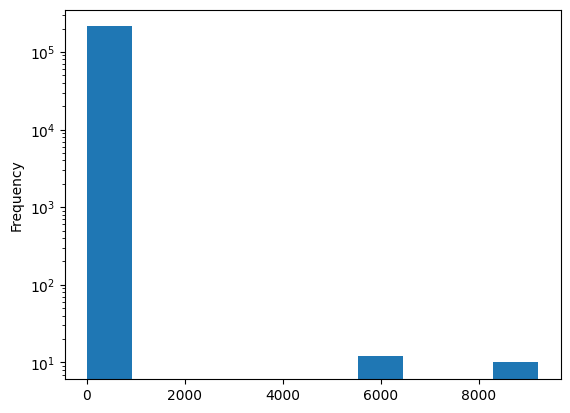

In [23]:
import matplotlib.pyplot as plt 

liste = []
for fichier in os.listdir("data"):
    df = pd.read_csv("data/"+ fichier)
    liste += list(df["LOCATION Accuracy ( m)"])


fig, ax = plt.subplots()
df = pd.DataFrame(liste)
df[df.keys()[0]].plot.hist()
# pd.DataFrame(liste)
ax.set_yscale("log")


In [27]:
import folium
import pandas as pd
import os 

# Je crée une liste de couleurs pour l'affichage
colors = ["blue","orange","green","yellow","red","black"]
index_color=0
# Je crée une carte centrée autour du lieu voulu
m = folium.Map(location=(46.168230, 15.859731),)

# Pour chaque fichier (CSV) présent dans le dossier "data"
for fichier in os.listdir("data/"):
    debut_trajet = True
    # Je lis le fichier
    df = pd.read_csv("data/" + fichier)
    # Je crée une liste pour la liste des points successifs du trajets
    loc_trajet = []
    # Pour chaque ligne du fichier CSV, en ne prenant que les colonnes latitudes et longitudes et en enlevant les lignes vides
    for i in df[['LOCATION Latitude : ','LOCATION Longitude : ',"LOCATION Accuracy ( m)"]].dropna().iloc : 
        # Si l'erreur est inférieure à 500m 
        if i[2] < 500:
            if debut_trajet : 
                folium.Marker(location=[i[0], i[1]],popup=fichier,icon=folium.Icon(color="green", icon="play"),).add_to(m)
                debut_trajet = False
            loc_trajet.append((i[0],i[1]))
    # Je crée une ligne de trajet sur la carte
    folium.PolyLine(loc_trajet, tooltip=fichier, color=colors[index_color]).add_to(m)
    # Je passe à la couleur suivante
    folium.Marker(location=[i[0], i[1]],popup=fichier,icon=folium.Icon(color="red",icon="stop"),).add_to(m)
    
    index_color = (index_color +1) % 6



# J'affiche la carte
m

C:\Users\covdang\AppData\Local\Temp\ipykernel_15096\478740315.py:21: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if i[2] < 500:
C:\Users\covdang\AppData\Local\Temp\ipykernel_15096\478740315.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  folium.Marker(location=[i[0], i[1]],popup=fichier,icon=folium.Icon(color="green", icon="play"),).add_to(m)
C:\Users\covdang\AppData\Local\Temp\ipykernel_15096\478740315.py:25: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by p

In [28]:
df.describe()

,ACCELEROMETER X (m/s²),ACCELEROMETER Y (m/s²),ACCELEROMETER Z (m/s²),GRAVITY X (m/s²),GRAVITY Y (m/s²),GRAVITY Z (m/s²),LINEAR ACCELERATION X (m/s²),LINEAR ACCELERATION Y (m/s²),LINEAR ACCELERATION Z (m/s²),GYROSCOPE X (rad/s),...,SOUND LEVEL (dB),LOCATION Latitude :,LOCATION Longitude :,LOCATION Altitude ( m),LOCATION Altitude-google ( m),LOCATION Altitude-atmospheric pressure ( m),LOCATION Speed ( Kmh),LOCATION Accuracy ( m),LOCATION ORIENTATION (°),Time since start in ms
count,1767.000000,1767.000000,1767.000000,1767.000000,1767.000000,1767.000000,1767.000000,1767.000000,1767.000000,1767.000000,...,1767.000000,1767.000000,1767.000000,1767.000000,0.0,0.0,1767.000000,1767.000000,1739.000000,1767.000000
mean,-0.103916,0.738360,9.621959,-0.075100,0.766170,9.500667,-0.013851,-0.081176,0.025133,0.008938,...,41.611823,46.165748,15.866004,758.927102,NaN,NaN,5.234324,14.178254,123.601035,441513.559706
std,1.575981,1.783497,2.949349,1.063285,1.522959,1.366786,1.015442,0.863442,2.267015,0.421576,...,13.254332,0.001471,0.003247,35.587524,NaN,NaN,0.956803,5.907737,36.768438,255116.607056
min,-6.570100,-14.948000,-5.801400,-2.992000,-9.064100,-2.935600,-4.341500,-4.412200,-5.758000,-3.051100,...,6.598000,46.162807,15.860093,722.260000,NaN,NaN,0.000000,12.226105,36.200000,14.000000
25%,-0.923000,-0.004500,7.680950,-0.568700,0.273600,9.652550,-0.570500,-0.646900,-1.794800,-0.217200,...,32.106000,46.164675,15.863083,737.120000,NaN,NaN,5.040000,12.226105,99.000000,220763.500000
50%,-0.074200,0.956500,9.531200,-0.133800,1.003000,9.724500,0.008300,-0.058800,-0.184100,0.012800,...,42.787000,46.166070,15.866422,742.880000,NaN,NaN,5.400000,12.226105,135.800000,441514.000000
75%,0.685800,1.816150,11.653950,0.261400,1.512900,9.772700,0.556150,0.514100,1.851200,0.241900,...,52.225000,46.166492,15.868988,760.870000,NaN,NaN,5.720000,12.226105,149.900000,662264.000000
max,10.834700,5.344400,19.185700,8.748400,3.843000,9.806600,7.787700,2.422900,9.184400,4.839400,...,69.467000,46.168633,15.870926,872.730000,NaN,NaN,8.780000,32.048534,184.600000,883013.000000
